### Rio-125: Ranking The Feature of Smartphone & Build a Python Application to Classify and Rank Dataset 

Step-1:Dataset cleaning & EDA

Step-2:Classified data set into hardware & software request

step-3:Merging classified dataset

Step-4:Ranking the final dataset

### Importing required Module:

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import plotly.express as pt
import warnings                                  
warnings.filterwarnings('ignore')  
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

### Reading data:

In [2]:
train = pd.read_csv("train.csv")
train

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


### EDA: Exploratory Data Analysis

### Column's names present in datasent:

In [3]:
columns=train.columns
columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

### Describing all columns in dataset

In [4]:
describe=train.describe()
describe

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


### Info all columns in dataset

In [5]:
info=train.info
info

<bound method DataFrame.info of       battery_power  blue  clock_speed  dual_sim  fc  four_g  int_memory  \
0               842     0          2.2         0   1       0           7   
1              1021     1          0.5         1   0       1          53   
2               563     1          0.5         1   2       1          41   
3               615     1          2.5         0   0       0          10   
4              1821     1          1.2         0  13       1          44   
...             ...   ...          ...       ...  ..     ...         ...   
1995            794     1          0.5         1   0       1           2   
1996           1965     1          2.6         1   0       0          39   
1997           1911     0          0.9         1   1       1          36   
1998           1512     0          0.9         0   4       1          46   
1999            510     1          2.0         1   5       1          45   

      m_dep  mobile_wt  n_cores  ...  px_height  px_wid

### Data types of columns:

In [6]:
dtypes=train.dtypes
dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

### Checking null values:

In [7]:
isnull=train.isnull().sum()
isnull

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

### Heatmap of dataset:

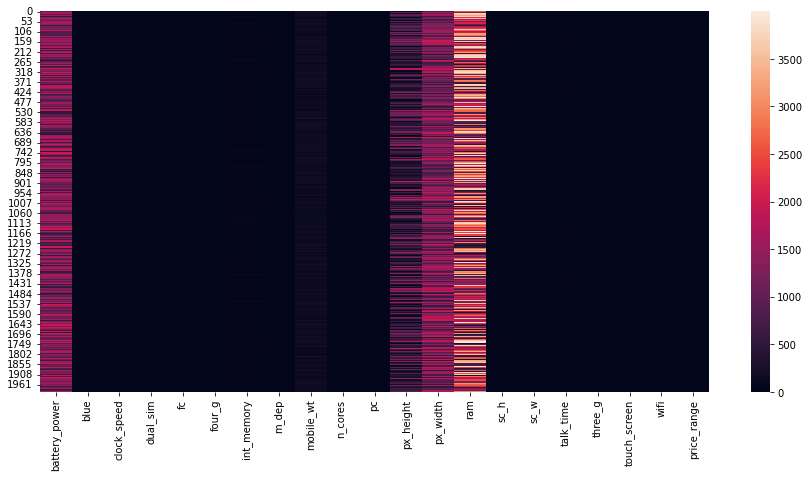

In [8]:
plt.figure(figsize=(15,7))
sns.heatmap(train);

### Correlation plot of dataset:

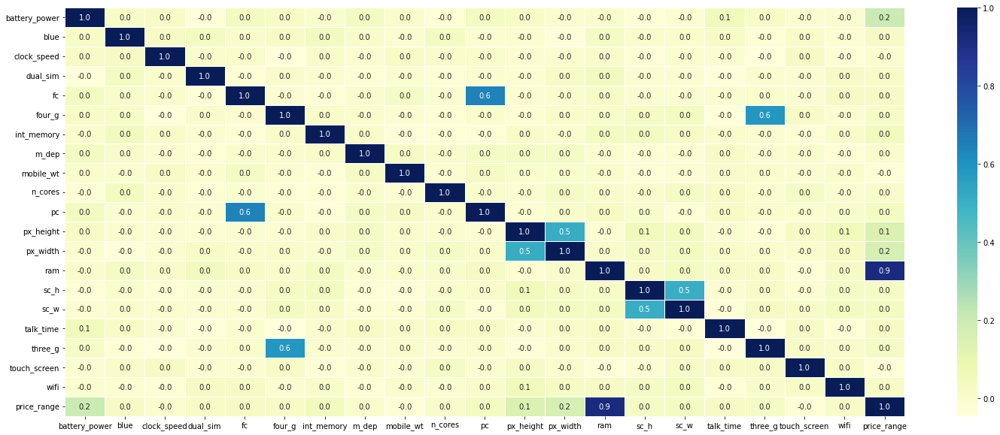

In [9]:
corr_ = train.corr()
f,ax = plt.subplots(figsize=(25, 10))
sns.heatmap(corr_,annot=True, linewidths=0.5, cmap="YlGnBu", fmt= '.1f',ax=ax)
plt.show()

### Pairplot of dataset:

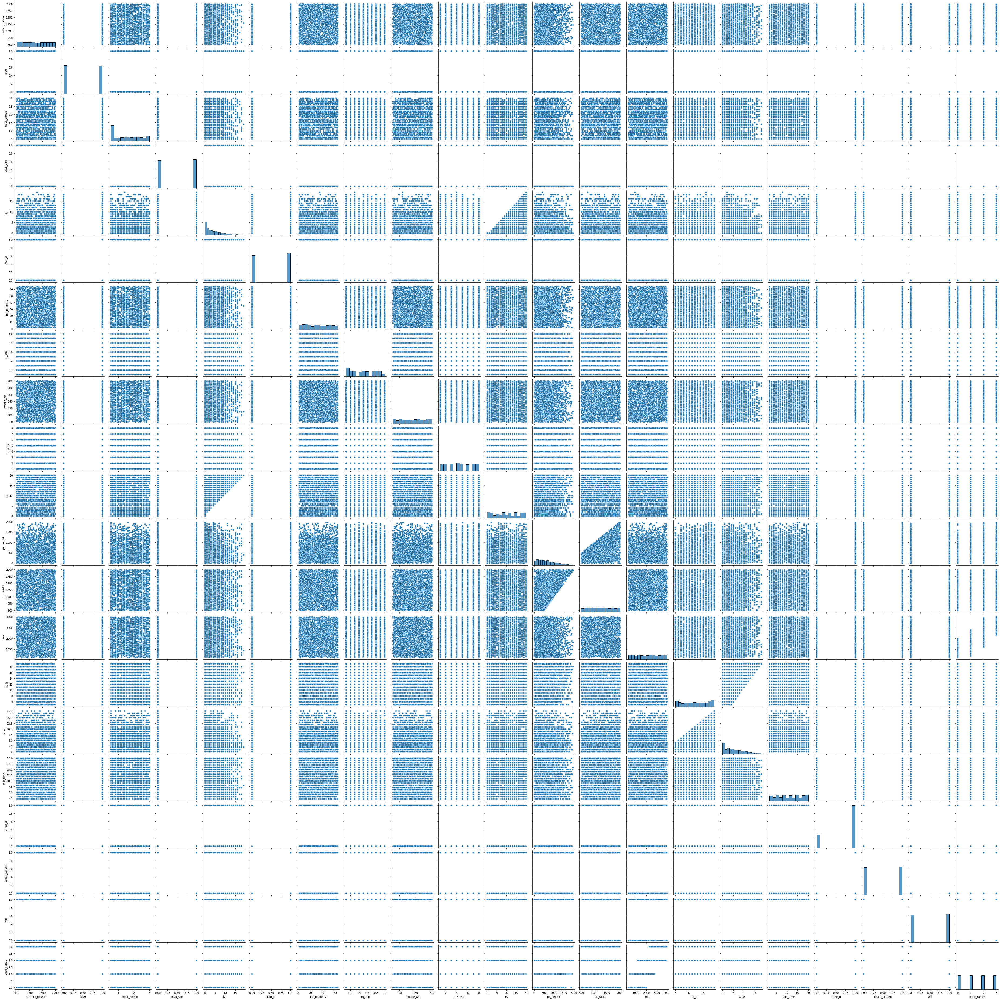

In [10]:
sns.pairplot(train)

### Histogram of dataset:

array([[<AxesSubplot:title={'center':'battery_power'}>,
        <AxesSubplot:title={'center':'blue'}>,
        <AxesSubplot:title={'center':'clock_speed'}>,
        <AxesSubplot:title={'center':'dual_sim'}>,
        <AxesSubplot:title={'center':'fc'}>],
       [<AxesSubplot:title={'center':'four_g'}>,
        <AxesSubplot:title={'center':'int_memory'}>,
        <AxesSubplot:title={'center':'m_dep'}>,
        <AxesSubplot:title={'center':'mobile_wt'}>,
        <AxesSubplot:title={'center':'n_cores'}>],
       [<AxesSubplot:title={'center':'pc'}>,
        <AxesSubplot:title={'center':'px_height'}>,
        <AxesSubplot:title={'center':'px_width'}>,
        <AxesSubplot:title={'center':'ram'}>,
        <AxesSubplot:title={'center':'sc_h'}>],
       [<AxesSubplot:title={'center':'sc_w'}>,
        <AxesSubplot:title={'center':'talk_time'}>,
        <AxesSubplot:title={'center':'three_g'}>,
        <AxesSubplot:title={'center':'touch_screen'}>,
        <AxesSubplot:title={'center':'wifi'}>],

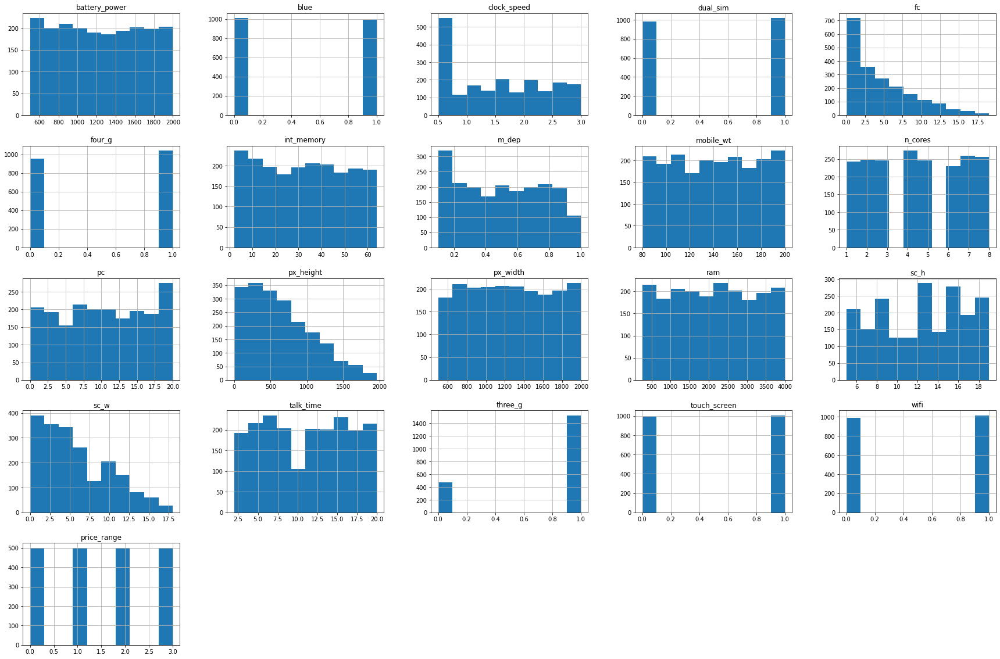

In [11]:
train.hist(figsize=(30,20))

### Countplot of dataset:

<Figure size 720x720 with 0 Axes>

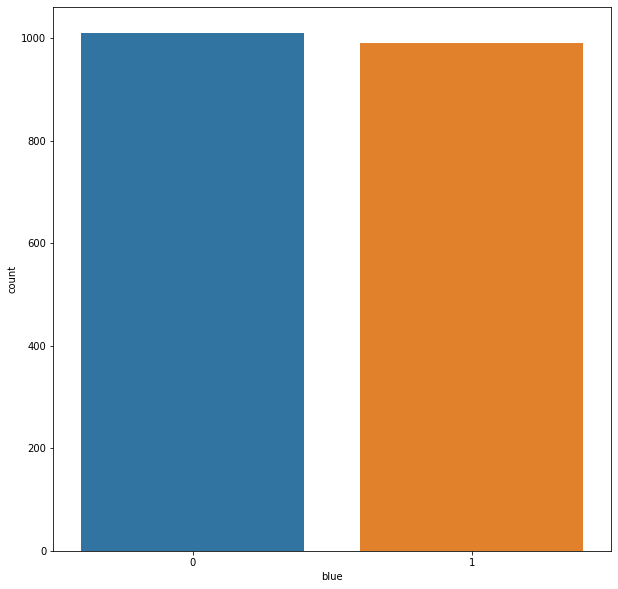

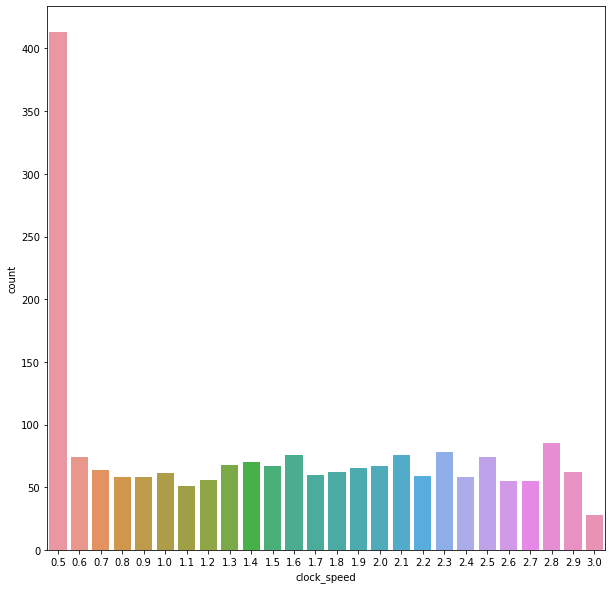

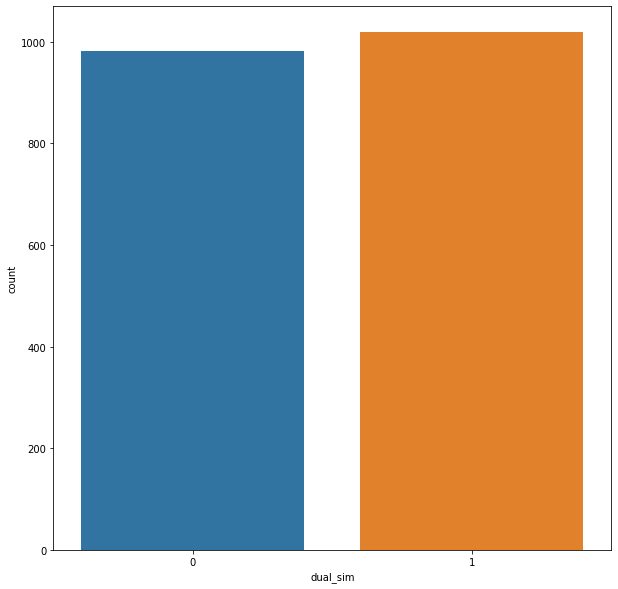

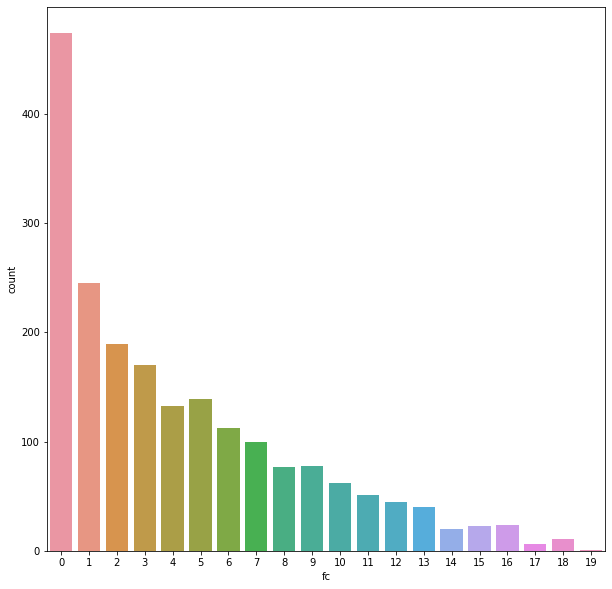

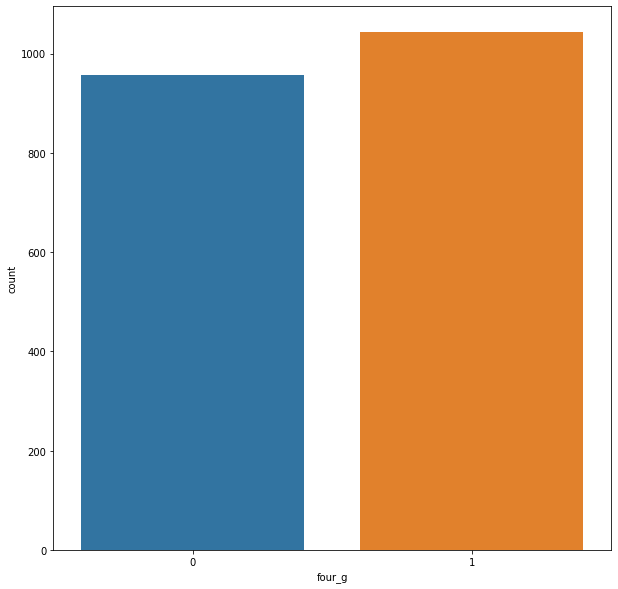

<Figure size 720x720 with 0 Axes>

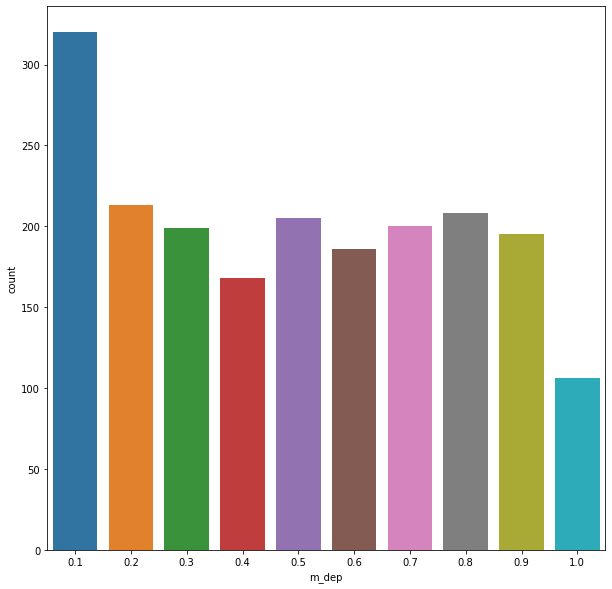

<Figure size 720x720 with 0 Axes>

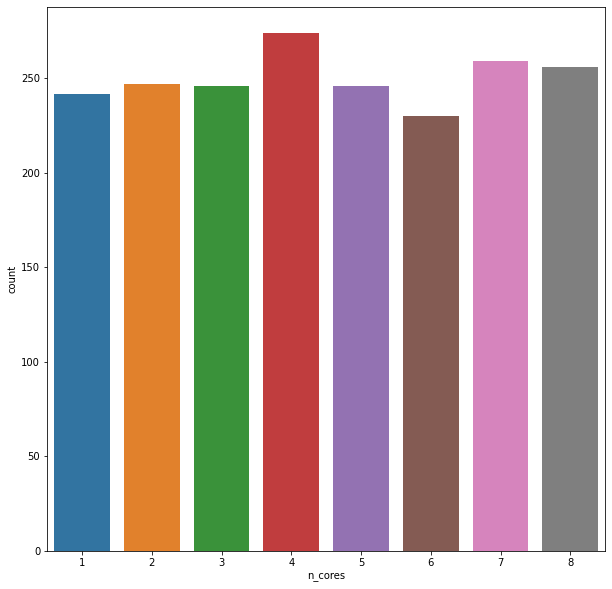

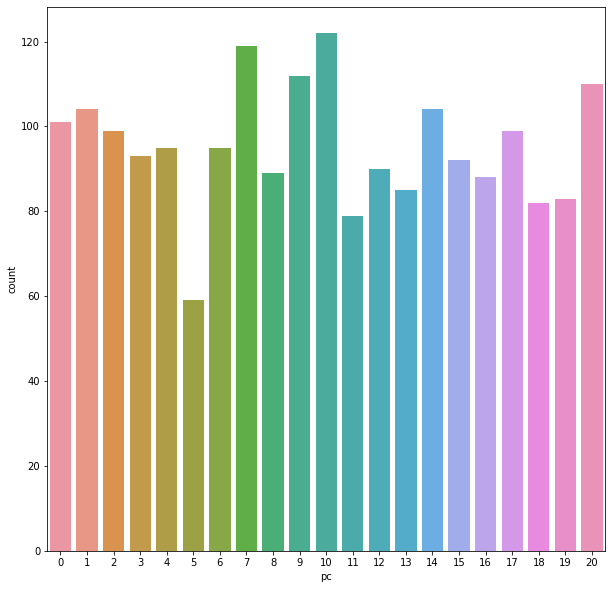

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

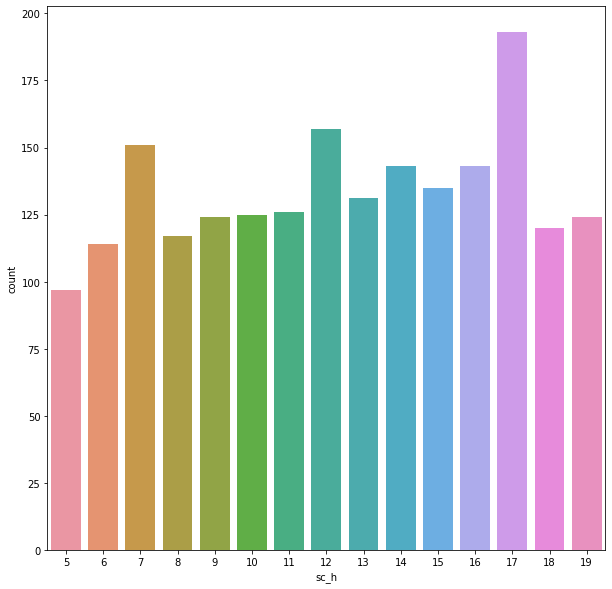

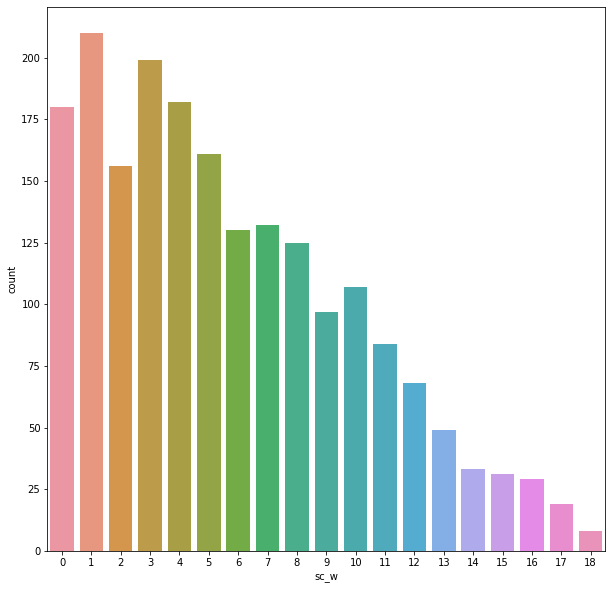

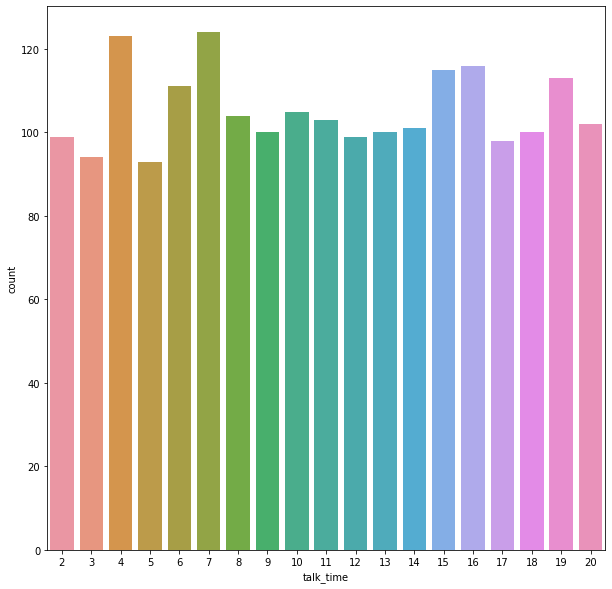

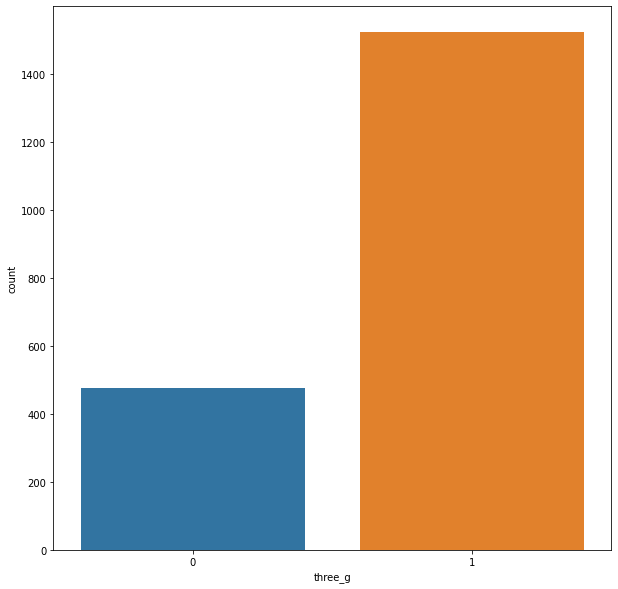

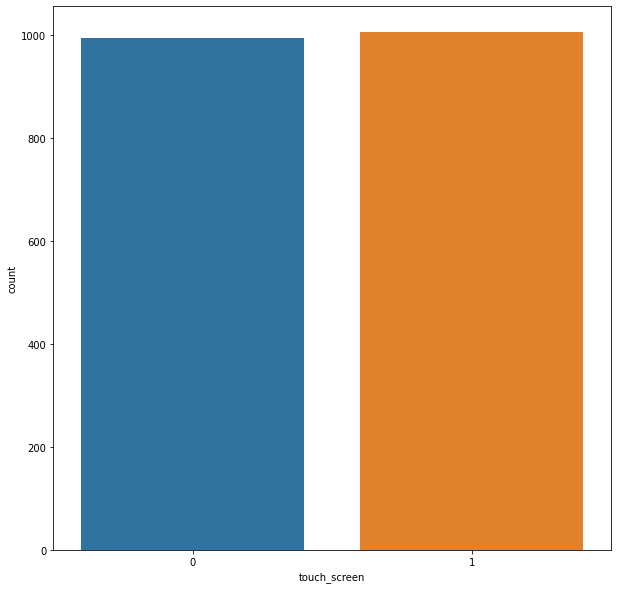

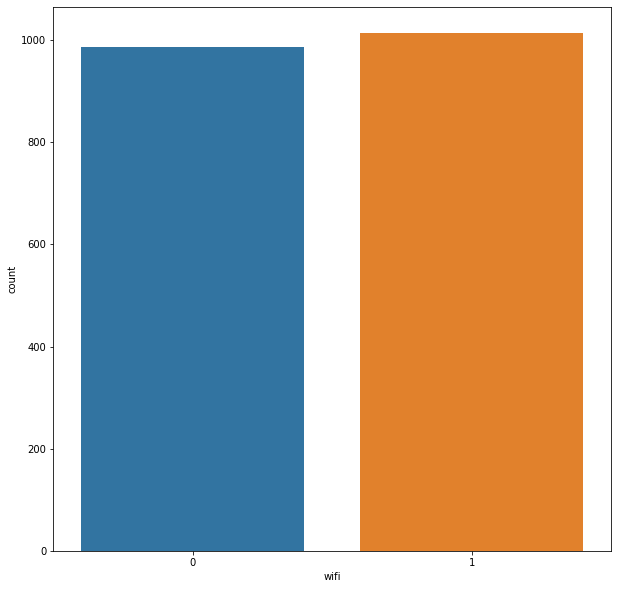

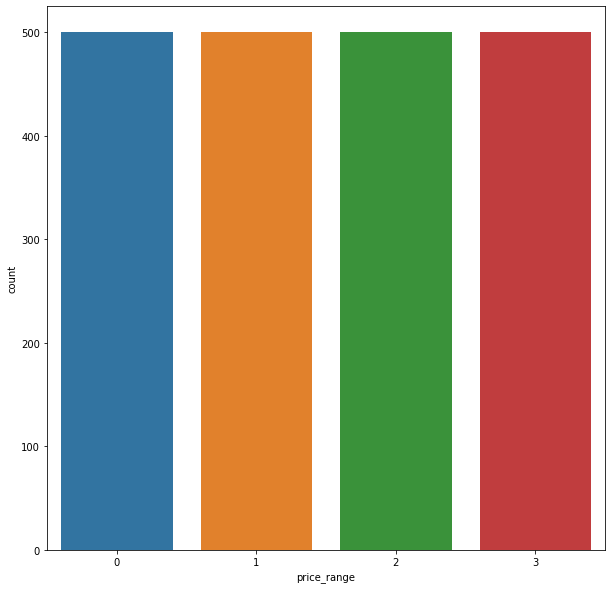

In [12]:
for i in train:
    plt.figure(figsize = (10,10))
    if(train[i].nunique()<30):
        sns.countplot(x=train[i])
        plt.show()

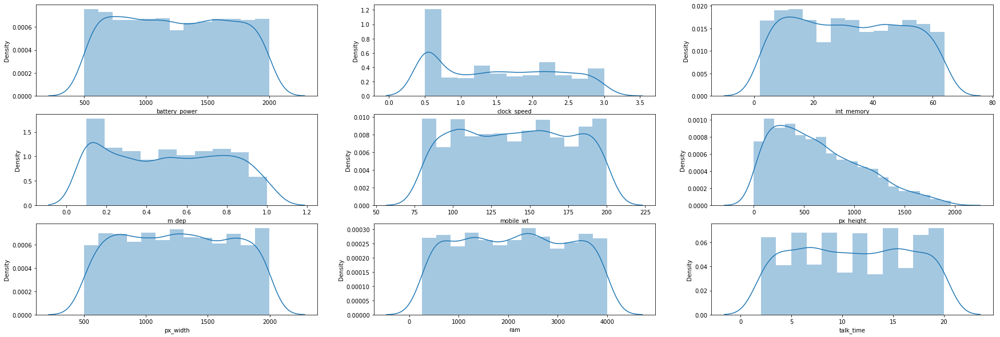

In [13]:
plt.figure(figsize = (30,10))
plt.subplot(331)
sns.distplot(train['battery_power'])
plt.subplot(332)
sns.distplot(train['clock_speed'])
plt.subplot(333)
sns.distplot(train['int_memory'])
plt.subplot(334)
sns.distplot(train['m_dep'])
plt.subplot(335)
sns.distplot(train['mobile_wt'])
plt.subplot(336)
sns.distplot(train['px_height'])
plt.subplot(337)
sns.distplot(train['px_width'])
plt.subplot(338)
sns.distplot(train['ram'])
plt.subplot(339)
sns.distplot(train['talk_time'])
plt.show()

In [14]:
train["Blue"]=''
for i in range(len(train)):
    if train['blue'][i]==0:
        train['Blue'][i]='No'
    else:
        train['Blue'][i]='Yes'
pt.pie(data_frame = train, names = 'Blue', title = 'Percentage of devices is Blue:')

In [15]:
train["DualSim"]=''
for i in range(len(train)):
    if train['dual_sim'][i]==0:
        train['DualSim'][i]='No'
    else:
        train['DualSim'][i]='Yes'
pt.pie(data_frame = train, names = 'DualSim', title = 'Percentage of devices having dual sim:')

In [16]:
train["4G"]=''
for i in range(len(train)):
    if train['four_g'][i]==0:
        train['4G'][i]='No'
    else:
        train['4G'][i]='Yes'
pt.pie(data_frame = train, names = '4G', title = 'Percentage of devices having 4G connection:')

In [17]:
train["3G"]=''
for i in range(len(train)):
    if train['three_g'][i]==0:
        train['3G'][i]='No'
    else:
        train['3G'][i]='Yes'
pt.pie(data_frame = train, names = '3G', title = 'Percentage of devices having 3G connection:')

In [18]:
train["Wifi"]=''
for i in range(len(train)):
    if train['wifi'][i]==0:
        train['Wifi'][i]='No'
    else:
        train['Wifi'][i]='Yes'
pt.pie(data_frame = train, names = 'Wifi', title = 'Percentage of devices having Wifi:')

In [19]:
train["Bluetooth"]=''
for i in range(len(train)):
    if train['blue'][i]==0:
        train['Bluetooth'][i]='No'
    else:
        train['Bluetooth'][i]='Yes'
pt.pie(data_frame = train, names = 'Bluetooth', title = 'Percentage of devices having bluetooth:')

In [20]:
train["Touchscreen"]=''
for i in range(len(train)):
    if train['touch_screen'][i]==0:
        train['Touchscreen'][i]='No'
    else:
        train['Touchscreen'][i]='Yes'
pt.pie(data_frame = train, names = 'Touchscreen', title = 'Percentage of devices having touch screen:')

In [21]:
train["cores"]=''
for i in range(len(train)):
    if train['n_cores'][i]==1:
        train['cores'][i]='single core'
    elif train['n_cores'][i]==2:
        train['cores'][i]='dual core'
    elif train['n_cores'][i]==3:
        train['cores'][i]='triple core'
    elif train['n_cores'][i]==4:
        train['cores'][i]='quad core'
    elif train['n_cores'][i]==5:
        train['cores'][i]='penta core'
    elif train['n_cores'][i]==6:
        train['cores'][i]='hexa core'
    elif train['n_cores'][i]==7:
        train['cores'][i]='hepta core'
    else:
        train['cores'][i]='octa core'
pt.pie(data_frame = train, names = 'cores', title = 'Percentage of devices having different types of cores:')

In [22]:
hard_req= train.loc[:,['battery_power','blue','dual_sim','fc','four_g','int_memory','m_dep','mobile_wt','n_cores','pc','px_height','px_width','ram','sc_h','sc_w','talk_time','three_g','wifi','price_range']]
hard_req

,battery_power,blue,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,wifi,price_range
0,842,0,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,1,1
1,1021,1,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,0,2
2,563,1,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,0,2
3,615,1,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,2
4,1821,1,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,1,0,1,2,0.8,106,6,14,1222,1890,668,13,4,19,1,0,0
1996,1965,1,1,0,0,39,0.2,187,4,3,915,1965,2032,11,10,16,1,1,2
1997,1911,0,1,1,1,36,0.7,108,8,3,868,1632,3057,9,1,5,1,0,3
1998,1512,0,0,4,1,46,0.1,145,5,5,336,670,869,18,10,19,1,1,0


In [23]:
soft_req= train.loc[:,['touch_screen','clock_speed']]
soft_req

,touch_screen,clock_speed
0,0,2.2
1,1,0.5
2,1,0.5
3,0,2.5
4,1,1.2
...,...,...
1995,1,0.5
1996,1,2.6
1997,1,0.9
1998,1,0.9


In [24]:
x = train.iloc[:, :-9].values
x

array([[8.420e+02, 0.000e+00, 2.200e+00, ..., 0.000e+00, 0.000e+00,
        1.000e+00],
       [1.021e+03, 1.000e+00, 5.000e-01, ..., 1.000e+00, 1.000e+00,
        0.000e+00],
       [5.630e+02, 1.000e+00, 5.000e-01, ..., 1.000e+00, 1.000e+00,
        0.000e+00],
       ...,
       [1.911e+03, 0.000e+00, 9.000e-01, ..., 1.000e+00, 1.000e+00,
        0.000e+00],
       [1.512e+03, 0.000e+00, 9.000e-01, ..., 1.000e+00, 1.000e+00,
        1.000e+00],
       [5.100e+02, 1.000e+00, 2.000e+00, ..., 1.000e+00, 1.000e+00,
        1.000e+00]])

In [25]:
y = train.iloc[:, -9].values
y

array([1, 2, 2, ..., 3, 0, 3], dtype=int64)

In [26]:
from sklearn.preprocessing import StandardScaler
sc_x = StandardScaler()
x = sc_x.fit_transform(x)
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25, random_state=0)

# 1.Logistic Regression:

In [27]:
log=LogisticRegression()
log.fit(x_train,y_train)

LogisticRegression()

In [28]:
print("Training score of LogisticRegression: {}".format(log.score(x_train,y_train)*100))

Training score of LogisticRegression: 97.93333333333332


In [29]:
y_predlog=log.predict(x_test)
y_predlog

array([3, 0, 2, 2, 3, 0, 0, 3, 3, 1, 1, 3, 0, 2, 3, 0, 3, 2, 2, 1, 0, 0,
       3, 1, 2, 2, 3, 1, 3, 1, 1, 0, 2, 0, 1, 3, 0, 0, 3, 3, 3, 1, 3, 3,
       1, 3, 0, 1, 3, 1, 1, 3, 0, 3, 0, 2, 2, 2, 0, 3, 3, 1, 3, 2, 1, 2,
       3, 2, 2, 2, 3, 2, 1, 0, 1, 3, 2, 2, 1, 2, 3, 3, 3, 0, 0, 0, 2, 1,
       2, 3, 1, 2, 2, 1, 0, 3, 3, 3, 0, 3, 1, 1, 2, 1, 3, 2, 2, 3, 2, 3,
       3, 0, 0, 1, 3, 3, 0, 0, 1, 0, 0, 3, 2, 2, 1, 2, 1, 1, 0, 2, 1, 3,
       3, 3, 3, 3, 3, 2, 0, 1, 1, 2, 1, 3, 0, 3, 0, 0, 2, 0, 1, 1, 1, 1,
       3, 0, 0, 3, 1, 3, 2, 1, 3, 1, 2, 3, 3, 2, 1, 0, 3, 1, 2, 3, 3, 0,
       2, 2, 3, 1, 2, 1, 0, 1, 2, 1, 2, 0, 3, 3, 1, 1, 0, 2, 3, 0, 1, 2,
       2, 0, 3, 3, 3, 1, 2, 3, 3, 3, 0, 0, 0, 2, 3, 3, 0, 0, 1, 3, 2, 3,
       3, 3, 0, 0, 2, 3, 3, 1, 0, 2, 0, 0, 0, 3, 2, 1, 2, 2, 1, 1, 0, 2,
       3, 3, 0, 0, 1, 3, 3, 1, 3, 0, 3, 1, 1, 0, 2, 3, 3, 2, 0, 0, 1, 2,
       3, 2, 2, 3, 1, 1, 0, 3, 3, 2, 1, 3, 2, 2, 2, 1, 0, 2, 2, 1, 0, 0,
       2, 2, 2, 3, 0, 1, 3, 0, 2, 2, 3, 0, 2, 0, 1,

In [30]:
acrr=accuracy_score(y_test,y_predlog)*100
print("Accuracy of Logistic Regression Classifier: {}%".format(accuracy_score(y_test,y_predlog)*100))

Accuracy of Logistic Regression Classifier: 96.2%


In [31]:
print("Confusion matrix Logistic Regression Classifier is: \n{}".format(confusion_matrix(y_test,y_predlog)))

Confusion matrix Logistic Regression Classifier is: 
[[122   2   0   0]
 [  3 103   4   0]
 [  0   5 116   4]
 [  0   0   1 140]]


In [32]:
print("{}".format(classification_report(y_test,y_predlog)))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       124
           1       0.94      0.94      0.94       110
           2       0.96      0.93      0.94       125
           3       0.97      0.99      0.98       141

    accuracy                           0.96       500
   macro avg       0.96      0.96      0.96       500
weighted avg       0.96      0.96      0.96       500



# 2. Naive Bayes-GaussianNB:

In [33]:
nb=GaussianNB()
nb.fit(x_train,y_train)

GaussianNB()

In [34]:
print("Training score of GaussianNB: {}".format(nb.score(x_train,y_train)*100))

Training score of GaussianNB: 81.39999999999999


In [35]:
y_pred=nb.predict(x_test)
y_pred

array([3, 0, 2, 1, 3, 0, 0, 3, 3, 1, 1, 3, 0, 2, 3, 0, 3, 2, 2, 1, 0, 0,
       3, 1, 1, 2, 3, 1, 3, 1, 1, 0, 1, 0, 2, 3, 0, 0, 3, 3, 3, 1, 3, 3,
       1, 3, 0, 2, 3, 1, 1, 3, 0, 2, 0, 3, 2, 2, 0, 3, 3, 1, 3, 2, 2, 2,
       3, 3, 2, 2, 3, 2, 1, 0, 1, 3, 2, 2, 2, 1, 3, 2, 3, 0, 0, 0, 2, 1,
       1, 3, 1, 2, 2, 1, 0, 3, 3, 3, 0, 3, 1, 2, 3, 1, 3, 1, 2, 3, 2, 3,
       3, 0, 0, 2, 3, 3, 0, 1, 1, 0, 1, 3, 2, 2, 1, 2, 1, 1, 0, 2, 1, 3,
       3, 3, 3, 3, 3, 1, 0, 2, 1, 2, 2, 3, 0, 3, 0, 0, 2, 0, 1, 1, 1, 1,
       3, 1, 0, 3, 1, 3, 2, 1, 3, 1, 2, 3, 3, 2, 1, 0, 3, 2, 2, 3, 3, 0,
       1, 2, 3, 0, 3, 1, 1, 2, 3, 1, 2, 0, 2, 3, 1, 1, 0, 2, 3, 0, 1, 3,
       2, 0, 3, 3, 3, 1, 1, 3, 2, 3, 0, 0, 0, 2, 3, 3, 0, 0, 1, 3, 2, 3,
       3, 3, 0, 0, 2, 2, 3, 2, 1, 2, 0, 0, 0, 3, 2, 0, 2, 2, 0, 1, 0, 2,
       3, 3, 0, 0, 1, 3, 3, 2, 3, 0, 3, 1, 1, 0, 1, 3, 2, 2, 0, 0, 1, 3,
       3, 2, 2, 3, 2, 1, 0, 3, 3, 2, 2, 3, 2, 2, 2, 1, 0, 2, 2, 1, 0, 0,
       2, 2, 2, 2, 0, 2, 2, 0, 1, 2, 3, 0, 2, 0, 0,

In [36]:
ac_nb=accuracy_score(y_test,y_pred)*100
print("Accuracy of Naive Bayes Classifier: {}".format(accuracy_score(y_test,y_pred)*100))

Accuracy of Naive Bayes Classifier: 84.39999999999999


In [37]:
print("Confusion matrix of Naive Bayes Classifier:\n{}".format(confusion_matrix(y_test,y_pred)))

Confusion matrix of Naive Bayes Classifier:
[[117   7   0   0]
 [  6  83  21   0]
 [  0  22  92  11]
 [  0   0  11 130]]


In [38]:
print("{}".format(classification_report(y_test,y_pred)))

              precision    recall  f1-score   support

           0       0.95      0.94      0.95       124
           1       0.74      0.75      0.75       110
           2       0.74      0.74      0.74       125
           3       0.92      0.92      0.92       141

    accuracy                           0.84       500
   macro avg       0.84      0.84      0.84       500
weighted avg       0.84      0.84      0.84       500



# 3.SVM:

In [39]:
svm=SVC(kernel='rbf')
svm.fit(x_train,y_train)

SVC()

In [40]:
print("Training score of SVM is: {}".format(svm.score(x_train,y_train)*100))

Training score of SVM is: 98.06666666666666


In [41]:
y_pred_svm=svm.predict(x_test)

In [42]:
ac_svm=accuracy_score(y_test,y_pred_svm)*100
print("Accuracy of SVM: {}".format(accuracy_score(y_test,y_pred_svm)*100))

Accuracy of SVM: 89.0


In [43]:
print("Confusion matrix of SVM: \n {}".format(confusion_matrix(y_test,y_pred_svm)))

Confusion matrix of SVM: 
 [[118   6   0   0]
 [  6  96   8   0]
 [  0  15 106   4]
 [  0   0  16 125]]


In [44]:
print("{}".format(classification_report(y_test,y_pred_svm)))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95       124
           1       0.82      0.87      0.85       110
           2       0.82      0.85      0.83       125
           3       0.97      0.89      0.93       141

    accuracy                           0.89       500
   macro avg       0.89      0.89      0.89       500
weighted avg       0.89      0.89      0.89       500



# 4.Decision Tree:

In [45]:
DT=DecisionTreeClassifier(criterion = "entropy")
DT.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [46]:
print("Training score of DecisionTreeClassifier: {}".format(DT.score(x_train,y_train)*100))

Training score of DecisionTreeClassifier: 100.0


In [47]:
y_pred_DT=DT.predict(x_test)
y_pred_DT

array([3, 0, 2, 2, 2, 0, 0, 2, 2, 1, 0, 3, 0, 2, 3, 0, 3, 2, 2, 1, 0, 0,
       3, 1, 1, 1, 3, 1, 3, 1, 1, 0, 2, 1, 2, 3, 0, 0, 3, 3, 2, 1, 3, 2,
       1, 3, 0, 1, 3, 1, 1, 3, 0, 3, 0, 2, 2, 1, 0, 3, 2, 1, 2, 1, 1, 2,
       3, 3, 2, 2, 3, 2, 1, 0, 1, 3, 2, 2, 1, 2, 3, 3, 3, 0, 0, 1, 2, 1,
       2, 3, 1, 3, 2, 1, 0, 3, 3, 3, 0, 3, 2, 1, 3, 1, 3, 2, 2, 3, 2, 3,
       3, 0, 0, 1, 3, 2, 0, 0, 1, 0, 0, 3, 2, 2, 1, 2, 1, 1, 0, 2, 1, 3,
       3, 3, 3, 3, 3, 2, 0, 0, 1, 2, 1, 3, 0, 3, 0, 0, 2, 0, 1, 1, 1, 1,
       3, 1, 1, 3, 1, 3, 2, 1, 3, 1, 2, 3, 3, 2, 1, 0, 3, 1, 2, 3, 3, 0,
       2, 2, 3, 0, 3, 1, 0, 1, 3, 2, 2, 0, 2, 3, 1, 1, 0, 2, 3, 0, 1, 3,
       1, 0, 3, 3, 3, 1, 2, 3, 3, 3, 0, 0, 0, 2, 3, 3, 0, 0, 1, 3, 2, 3,
       3, 3, 0, 0, 2, 3, 3, 2, 0, 2, 0, 0, 0, 3, 3, 0, 2, 2, 0, 1, 0, 3,
       3, 3, 0, 0, 1, 3, 3, 1, 3, 0, 3, 1, 1, 0, 2, 3, 3, 2, 0, 1, 1, 2,
       3, 2, 2, 3, 1, 1, 1, 3, 2, 2, 1, 3, 2, 2, 2, 0, 0, 2, 2, 2, 0, 0,
       2, 2, 2, 2, 0, 1, 3, 0, 1, 2, 2, 0, 2, 1, 1,

In [48]:
ac_DT=accuracy_score(y_test,y_pred_DT)*100
print("Accuracy of Decision Tree Classifier: {}".format(ac_DT))

Accuracy of Decision Tree Classifier: 84.2


In [49]:
print("Confusion matrix of Decision Tree Classifier: \n {}".format(confusion_matrix(y_test,y_pred_DT)))

Confusion matrix of Decision Tree Classifier: 
 [[114  10   0   0]
 [ 10  92   8   0]
 [  0  14  96  15]
 [  0   0  22 119]]


In [50]:
print("{}".format(classification_report(y_test,y_pred_DT)))

              precision    recall  f1-score   support

           0       0.92      0.92      0.92       124
           1       0.79      0.84      0.81       110
           2       0.76      0.77      0.76       125
           3       0.89      0.84      0.87       141

    accuracy                           0.84       500
   macro avg       0.84      0.84      0.84       500
weighted avg       0.84      0.84      0.84       500



# 5.1.Random Forest Classifier:

In [51]:
RF=RandomForestClassifier(n_estimators=300)
RF.fit(x_train,y_train)

RandomForestClassifier(n_estimators=300)

In [52]:
print("Training score of Random Forest Classifier: {}".format(RF.score(x_train,y_train)*100))

Training score of Random Forest Classifier: 100.0


In [53]:
y_pred_RF=RF.predict(x_test)
y_pred_RF

array([3, 0, 2, 1, 3, 0, 0, 3, 3, 1, 0, 3, 0, 2, 3, 0, 3, 2, 2, 1, 0, 0,
       3, 1, 1, 2, 3, 1, 3, 1, 1, 0, 1, 0, 2, 3, 0, 0, 3, 3, 3, 1, 3, 2,
       1, 3, 0, 1, 3, 1, 1, 3, 0, 3, 0, 2, 2, 2, 0, 3, 3, 1, 3, 2, 1, 2,
       3, 3, 1, 2, 3, 2, 1, 0, 1, 3, 2, 2, 2, 1, 3, 3, 3, 0, 0, 0, 2, 0,
       2, 3, 1, 2, 2, 1, 0, 3, 3, 3, 0, 3, 1, 2, 3, 1, 3, 1, 2, 3, 2, 3,
       3, 0, 0, 2, 2, 3, 0, 0, 1, 0, 1, 3, 2, 2, 1, 2, 1, 1, 0, 2, 1, 3,
       3, 3, 3, 3, 3, 1, 0, 1, 1, 2, 2, 3, 0, 3, 0, 0, 2, 0, 1, 1, 1, 1,
       3, 0, 0, 3, 1, 3, 2, 1, 3, 1, 2, 3, 3, 2, 1, 0, 3, 2, 2, 3, 3, 0,
       1, 2, 3, 0, 2, 1, 0, 1, 3, 1, 2, 0, 2, 3, 1, 1, 0, 2, 3, 0, 1, 3,
       2, 0, 3, 3, 3, 1, 1, 3, 3, 3, 0, 0, 0, 2, 3, 3, 0, 0, 1, 3, 2, 3,
       3, 3, 0, 0, 2, 2, 3, 2, 0, 2, 0, 0, 0, 3, 3, 0, 2, 2, 1, 1, 0, 2,
       3, 3, 0, 0, 1, 3, 3, 1, 3, 0, 3, 1, 1, 0, 2, 3, 2, 2, 0, 0, 1, 2,
       3, 2, 2, 3, 2, 1, 0, 3, 3, 2, 1, 3, 2, 2, 2, 1, 0, 2, 1, 1, 0, 0,
       2, 2, 2, 2, 0, 1, 3, 0, 1, 2, 3, 0, 2, 0, 1,

In [54]:
ac_RF=accuracy_score(y_test,y_pred_RF)*100
print("Accuracy of Random Forest Classifier: {}".format(ac_RF))

Accuracy of Random Forest Classifier: 87.4


In [55]:
print("Confusion matrix of Random Forest Classifier:\n {}".format(confusion_matrix(y_test,y_pred_RF)))

Confusion matrix of Random Forest Classifier:
 [[122   2   0   0]
 [  9  88  13   0]
 [  0  17  97  11]
 [  0   0  11 130]]


In [56]:
print("{}".format(classification_report(y_test,y_pred_RF)))

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       124
           1       0.82      0.80      0.81       110
           2       0.80      0.78      0.79       125
           3       0.92      0.92      0.92       141

    accuracy                           0.87       500
   macro avg       0.87      0.87      0.87       500
weighted avg       0.87      0.87      0.87       500



# 5.2.Random Forest Regressor:

In [57]:
train_accuracy=[]
test_accuracy=[]
for i in range(100,600,100):
    c=RandomForestRegressor(n_estimators=i)
    c.fit(x_train,y_train)
    train_accuracy.append(c.score(x_train,y_train))
    test_accuracy.append(c.score(x_test,y_test))

In [58]:
frame=pd.DataFrame({"n_neighbors":range(100,600,100),"train_accuracy":train_accuracy,"test_accuracy":test_accuracy})
frame

,n_neighbors,train_accuracy,test_accuracy
0,100,0.990904,0.938794
1,200,0.991253,0.940506
2,300,0.991358,0.941108
3,400,0.991254,0.940618
4,500,0.991324,0.941773


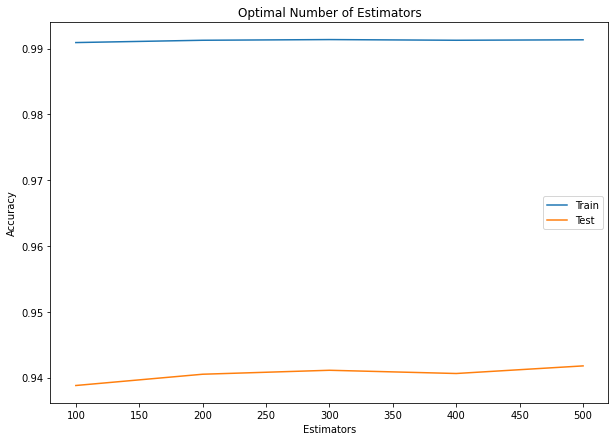

In [59]:
plt.figure(figsize=(10,7))
plt.plot(range(100,600,100),frame["train_accuracy"],label="Train")
plt.plot(range(100,600,100),frame["test_accuracy"],label="Test")
plt.title("Optimal Number of Estimators")
plt.xlabel("Estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [60]:
print(frame)

   n_neighbors  train_accuracy  test_accuracy
0          100        0.990904       0.938794
1          200        0.991253       0.940506
2          300        0.991358       0.941108
3          400        0.991254       0.940618
4          500        0.991324       0.941773


# Comparing accuracy of all the models:

In [61]:
classifiers=["LogisticRegression","GaussianNB","SVM","DecisionTreeClassifier","RandomForestClassifier"]
accuracy_=[acrr,ac_nb,ac_svm,ac_DT,ac_RF]
df_ac=pd.DataFrame({'model':classifiers,"accuracy":accuracy_})
pt.histogram(data_frame=df_ac,x="model",y="accuracy")

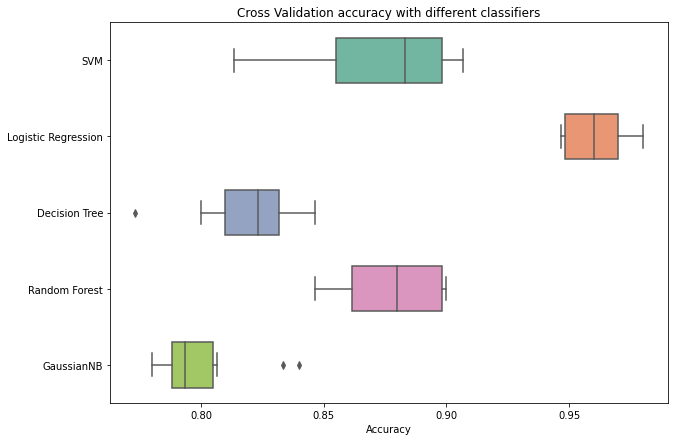

In [62]:
kfold = KFold(n_splits = 10)
xyz = []
accuracy = []

classifiers=["SVM","Logistic Regression","Decision Tree","Random Forest","GaussianNB"]
models=[SVC(kernel='rbf'),LogisticRegression(),DecisionTreeClassifier(),RandomForestClassifier(n_estimators=300,random_state=0),GaussianNB()]

for i in models:
    model = i
    cv_result=cross_val_score(model,x_train,y_train,cv=kfold,scoring="accuracy")
    cv_result = cv_result
    xyz.append(cv_result.mean())
    accuracy.append(cv_result)
    
cv_models_datafeame= pd.DataFrame(xyz, index = classifiers)
cv_models_datafeame.columns = ['CV Mean']
cv_models_datafeame
cv_models_datafeame.sort_values(['CV Mean'], ascending =[0])

box = pd.DataFrame(accuracy, index = [classifiers])
boxT = box.T
plt.figure(figsize = (10,7))
ax = sns.boxplot(data = boxT, orient = "h", palette = "Set2", width = 0.6)
ax.set_yticklabels(classifiers)
ax.set_title('Cross Validation accuracy with different classifiers')
ax.set_xlabel('Accuracy')

plt.show()


# Merging:

In [64]:
new_df=pd.concat([hard_req, soft_req])
new_df

,battery_power,blue,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,...,px_width,ram,sc_h,sc_w,talk_time,three_g,wifi,price_range,touch_screen,clock_speed
0,842.0,0.0,0.0,1.0,0.0,7.0,0.6,188.0,2.0,2.0,...,756.0,2549.0,9.0,7.0,19.0,0.0,1.0,1.0,NaN,NaN
1,1021.0,1.0,1.0,0.0,1.0,53.0,0.7,136.0,3.0,6.0,...,1988.0,2631.0,17.0,3.0,7.0,1.0,0.0,2.0,NaN,NaN
2,563.0,1.0,1.0,2.0,1.0,41.0,0.9,145.0,5.0,6.0,...,1716.0,2603.0,11.0,2.0,9.0,1.0,0.0,2.0,NaN,NaN
3,615.0,1.0,0.0,0.0,0.0,10.0,0.8,131.0,6.0,9.0,...,1786.0,2769.0,16.0,8.0,11.0,1.0,0.0,2.0,NaN,NaN
4,1821.0,1.0,0.0,13.0,1.0,44.0,0.6,141.0,2.0,14.0,...,1212.0,1411.0,8.0,2.0,15.0,1.0,0.0,1.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.5
1996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,2.6
1997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.9
1998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.9


# Ranking:

In [65]:
data = train.rank(axis=1,ascending=False)
data

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,2.0,19.0,10.0,19.0,14.0,19.0,8.5,16.0,4.0,11.5,...,5.0,3.0,1.0,7.0,8.5,6.0,19.0,19.0,14.0,14.0
1,3.0,15.0,19.0,15.0,20.5,15.0,6.0,18.0,5.0,10.5,...,4.0,2.0,1.0,7.0,10.5,8.0,15.0,15.0,20.5,12.0
2,4.0,16.0,20.0,16.0,12.0,16.0,6.0,19.0,5.0,10.0,...,3.0,2.0,1.0,7.0,12.0,8.0,16.0,16.0,21.0,12.0
3,4.0,14.5,12.0,19.0,19.0,19.0,8.0,16.0,5.0,11.0,...,3.0,2.0,1.0,6.0,10.0,7.0,14.5,19.0,19.0,13.0
4,1.0,16.0,13.0,20.5,9.0,16.0,6.0,19.0,5.0,11.5,...,4.0,3.0,2.0,10.0,11.5,7.0,16.0,16.0,20.5,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,3.0,14.0,18.0,14.0,20.0,14.0,11.0,17.0,5.0,9.0,...,2.0,1.0,4.0,8.0,10.0,6.0,14.0,14.0,20.0,20.0
1996,2.5,16.0,12.0,16.0,20.5,20.5,6.0,19.0,5.0,10.0,...,4.0,2.5,1.0,8.0,9.0,7.0,16.0,16.0,16.0,13.0
1997,2.0,20.5,18.0,14.5,14.5,14.5,6.0,19.0,5.0,8.0,...,4.0,3.0,1.0,7.0,14.5,9.0,14.5,14.5,20.5,10.5
1998,1.0,20.0,17.0,20.0,12.0,14.5,6.0,18.0,5.0,10.5,...,4.0,3.0,2.0,8.0,9.0,7.0,14.5,14.5,14.5,20.0


In [66]:
data.sort_values(['battery_power','blue','clock_speed','dual_sim','fc','four_g','int_memory','m_dep','mobile_wt','n_cores','pc','px_height','px_width','ram','sc_h','sc_w','talk_time','three_g','touch_screen','wifi'],ascending=False)
data

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,2.0,19.0,10.0,19.0,14.0,19.0,8.5,16.0,4.0,11.5,...,5.0,3.0,1.0,7.0,8.5,6.0,19.0,19.0,14.0,14.0
1,3.0,15.0,19.0,15.0,20.5,15.0,6.0,18.0,5.0,10.5,...,4.0,2.0,1.0,7.0,10.5,8.0,15.0,15.0,20.5,12.0
2,4.0,16.0,20.0,16.0,12.0,16.0,6.0,19.0,5.0,10.0,...,3.0,2.0,1.0,7.0,12.0,8.0,16.0,16.0,21.0,12.0
3,4.0,14.5,12.0,19.0,19.0,19.0,8.0,16.0,5.0,11.0,...,3.0,2.0,1.0,6.0,10.0,7.0,14.5,19.0,19.0,13.0
4,1.0,16.0,13.0,20.5,9.0,16.0,6.0,19.0,5.0,11.5,...,4.0,3.0,2.0,10.0,11.5,7.0,16.0,16.0,20.5,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,3.0,14.0,18.0,14.0,20.0,14.0,11.0,17.0,5.0,9.0,...,2.0,1.0,4.0,8.0,10.0,6.0,14.0,14.0,20.0,20.0
1996,2.5,16.0,12.0,16.0,20.5,20.5,6.0,19.0,5.0,10.0,...,4.0,2.5,1.0,8.0,9.0,7.0,16.0,16.0,16.0,13.0
1997,2.0,20.5,18.0,14.5,14.5,14.5,6.0,19.0,5.0,8.0,...,4.0,3.0,1.0,7.0,14.5,9.0,14.5,14.5,20.5,10.5
1998,1.0,20.0,17.0,20.0,12.0,14.5,6.0,18.0,5.0,10.5,...,4.0,3.0,2.0,8.0,9.0,7.0,14.5,14.5,14.5,20.0
